In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 1000
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import dataset

df = pd.read_excel('glass.xlsx',sheet_name='glass')
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


# **EDA**

In [3]:
# Descriptive statistics
df.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,2.780374
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,2.103739
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,1.000000
25%,1.516522,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,1.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,2.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,3.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,7.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RI      214 non-null    float64
 1   Na      214 non-null    float64
 2   Mg      214 non-null    float64
 3   Al      214 non-null    float64
 4   Si      214 non-null    float64
 5   K       214 non-null    float64
 6   Ca      214 non-null    float64
 7   Ba      214 non-null    float64
 8   Fe      214 non-null    float64
 9   Type    214 non-null    int64  
dtypes: float64(9), int64(1)
memory usage: 16.8 KB


In [5]:
df.dtypes

RI      float64
Na      float64
Mg      float64
Al      float64
Si      float64
K       float64
Ca      float64
Ba      float64
Fe      float64
Type      int64
dtype: object

In [6]:
# Check missing values
df.isna().sum()

RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64

In [7]:
# Check duplicate values
df[df.duplicated(keep=False)]

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
38,1.52213,14.21,3.82,0.47,71.77,0.11,9.57,0.0,0.0,1
39,1.52213,14.21,3.82,0.47,71.77,0.11,9.57,0.0,0.0,1


In [8]:
# Drop duplicates
df.drop_duplicates(inplace=True)

In [9]:
# Check duplicated rows
df.duplicated(keep=False).sum()

0

<Axes: >

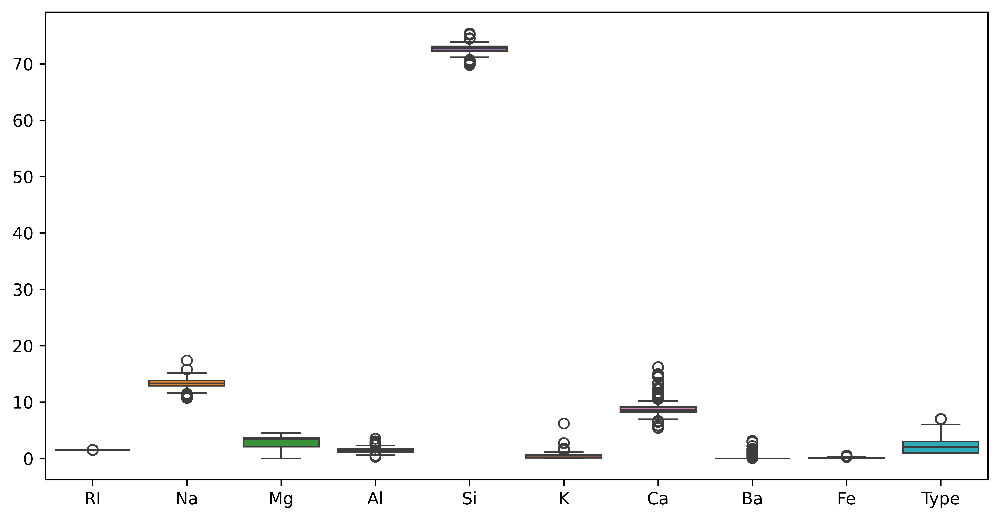

In [10]:
# Boxplot for outliers
sns.boxplot(df)

In [11]:
# Create individual boxplots for each column

fig, axs = plt.subplots(5,2,figsize=(10,15))

for i, axis in enumerate(axs.flat):
    axis.boxplot(df.iloc[:,i],vert=False)
    axis.set_title(df.columns[i])

plt.tight_layout()

We see that there are lot of outliers present in most of the columns.

In [12]:
sns.pairplot(df,palette='viridis')

<Axes: >

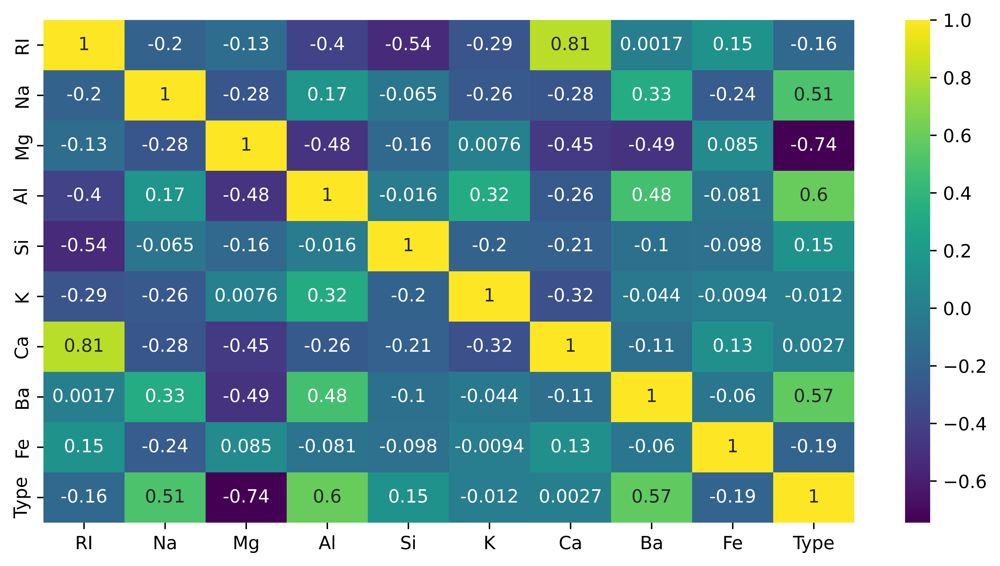

In [13]:
# Heatmap showing the correlations between each feature

sns.heatmap(df.corr(), annot=True, cmap='viridis')

From the pariplot and Heatmap, we see that there are strong relationships between 
- 'RI' and 'Ca'
- 'Mg' and 'Type'
- 'Al' and 'Type'
- 'Na' and 'Type'

As there are no distance calculations involved in a Random Forest model, the data set doesn't have to be feature scaled.

# **Model Building**


In [14]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [15]:
# Split the data
x = df.drop(columns='Type')
y = df['Type']

xtrain, xtest, ytrain, ytest = train_test_split(x,y,test_size=0.2,random_state=1)

In [16]:
# Model building
rf = RandomForestClassifier()
rf.fit(xtrain,ytrain)

ypred = rf.predict(xtest)

In [17]:
# Print report
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.89      0.89      0.89        18
           2       0.86      0.92      0.89        13
           3       0.75      0.50      0.60         6
           5       1.00      1.00      1.00         1
           6       0.67      1.00      0.80         2
           7       1.00      1.00      1.00         3

    accuracy                           0.86        43
   macro avg       0.86      0.89      0.86        43
weighted avg       0.86      0.86      0.85        43



The model has an accuracy of 86%

## **Bagging Method**

In [18]:
from sklearn.ensemble import BaggingClassifier

In [19]:
# Automating model building

def prediction(model):
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    print(f'Train accuracy: {model.score(xtrain,ytrain)}')
    print(f'Test accuracy: {model.score(xtest,ytest)}')
    print(classification_report(ytest,ypred))

In [29]:
prediction(BaggingClassifier())

Train accuracy: 0.9823529411764705
Test accuracy: 0.7441860465116279
              precision    recall  f1-score   support

           1       0.82      0.78      0.80        18
           2       0.61      0.85      0.71        13
           3       1.00      0.33      0.50         6
           5       0.00      0.00      0.00         1
           6       0.67      1.00      0.80         2
           7       1.00      1.00      1.00         3

    accuracy                           0.74        43
   macro avg       0.68      0.66      0.63        43
weighted avg       0.77      0.74      0.73        43



The Bagging Classifier is overfitted as the training accuracy is higher than testing accuracy.

## **Boosting Method**

In [21]:
from sklearn.ensemble import GradientBoostingClassifier

In [22]:
# Check model report
prediction(GradientBoostingClassifier())

Train accuracy: 1.0
Test accuracy: 0.7906976744186046
              precision    recall  f1-score   support

           1       0.84      0.89      0.86        18
           2       0.79      0.85      0.81        13
           3       0.50      0.33      0.40         6
           5       0.00      0.00      0.00         1
           6       0.67      1.00      0.80         2
           7       1.00      1.00      1.00         3

    accuracy                           0.79        43
   macro avg       0.63      0.68      0.65        43
weighted avg       0.76      0.79      0.77        43



The Boosting Classifier is overfitted as the training accuracy is higher than testing accuracy.

In [55]:
# rf.score(xtest,ytest)

In [57]:
# Show accuracies for each model

results = pd.DataFrame()

results['Method'] = ['Random Forest','Bagging','Gradient Boosting']
results['Training accuracy'] = [1.0, 0.98, 1.0]
results['testing accuracy'] = [0.86, 0.744,0.79]

results

,Method,Training accuracy,testing accuracy
0,Random Forest,1.00,0.860
1,Bagging,0.98,0.744
2,Gradient Boosting,1.00,0.790


Here we see that the accuracies of each model is quite different and indicates that there is overfitting in the model.

1. Explain Bagging and Boosting methods. How is it different from each other.
   - Bagging
     Bootstrap Aggregating (Bagging) is an ensemble technique where a collection of homogeneous weak learners (models) are put together to learn independently (parallel) and combine the result by some kind of deterministic averaging process.
   - Boosting
     Boosting is another ensemble technique where a collection of homogeneous weak learners (models) are put together to learn sequentially in a very adaptive way, and combines them following a deterministic strategy.

2. Explain how to handle imbalance in the data.
Data Imbalances are caused when the classes are not equally represented. The following methods can be used to avoid imbalance in the data:
   - Oversampling the minority class can avoid imbalanced data.
   - Undersampling the majority class
   - Hybrid sampling - where we add more data to the minority group and remove some data from the majority group
   - SMOTE creates synthetic samples based on feature similarities between existing minority instances.
   - ADASYN (Adaptive Synthetic Sampling) creates synthetic data for minority class samples that are harder to classify.